# Medical Imaging Coursework 25/26

*Harvey Bermingham*

### Development and Testing Notebook

The notebook below is used to for the testing and development of scripts.

In [7]:
import sys, os
sys.path.insert(0, os.path.abspath('..'))

%load_ext autoreload
%autoreload 2

from med_im import module_1
from med_im import module_2

CT_SEED = 123

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


## Module 1

### Exercise 1.1 (a)

Image shape: (512, 512)
Min value: 0.0
Max value: 0.01


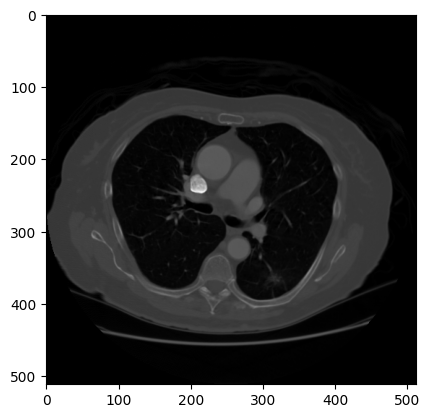

In [8]:
image = module_1.image_outputs(save_filename='exercise_1_1_a.png')

### Exercise 1.1 (b)

SimulateGaussian(𝜇= 0, 𝜎= 0.05) and Poisson noise atthree different levels (𝐼0 ∈ [105,103,102]). Simulate these sinograms at different total number of angles, 360, 90, 20.

/Users/harvey/Documents/Cambridge/Medical Imaging/Coursework/med_env2/lib/python3.12/site-packages/skimage/transform/radon_transform.py:74: UserWarning: Radon transform: image must be zero outside the reconstruction circle
  warn(


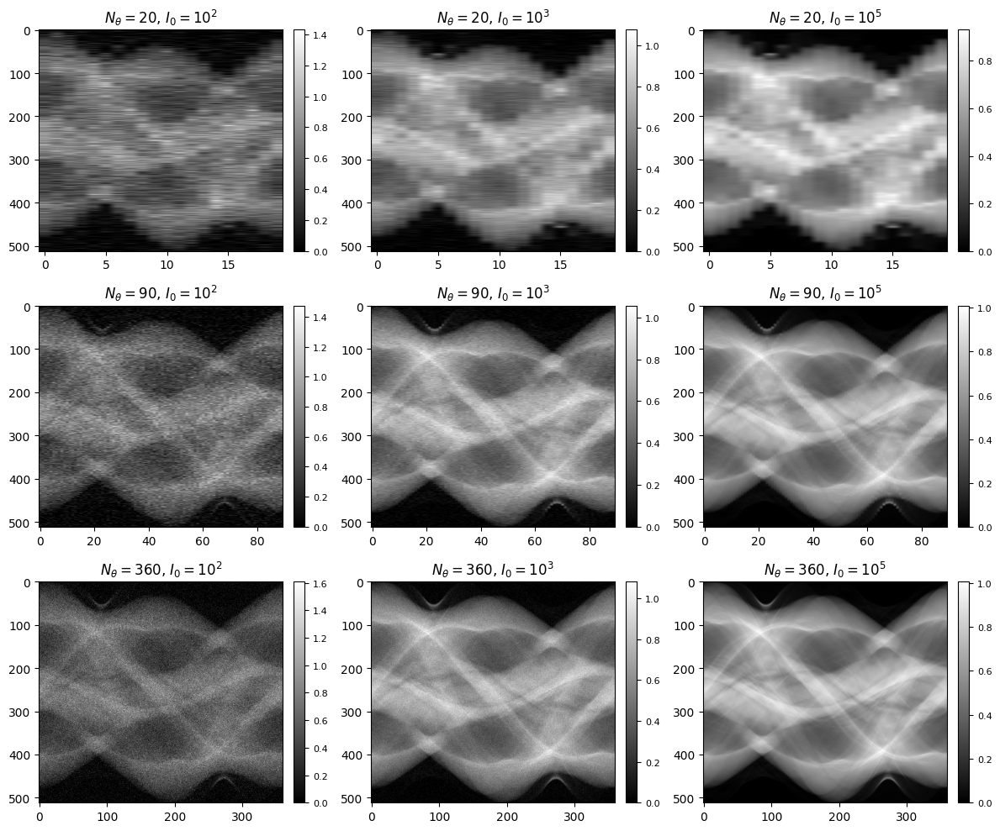

In [9]:
noisy_sinogram_dict = module_1.create_noisy_sinograms(image, seed=CT_SEED)
module_1.plot_sinogram_dict(noisy_sinogram_dict, save_filename='exercise_1_1_b.png')

### Exercise 1.1 (c)

Reconstruct all sinograms,first with FBP, and then Gradient Descent. What is the performance? When do they do better or worse? Display reconstruction error and image quality metrics and do a comparative analysis. What does eachs canning procedure and algorithmmean in clinical practice for the patients? what are their impact?

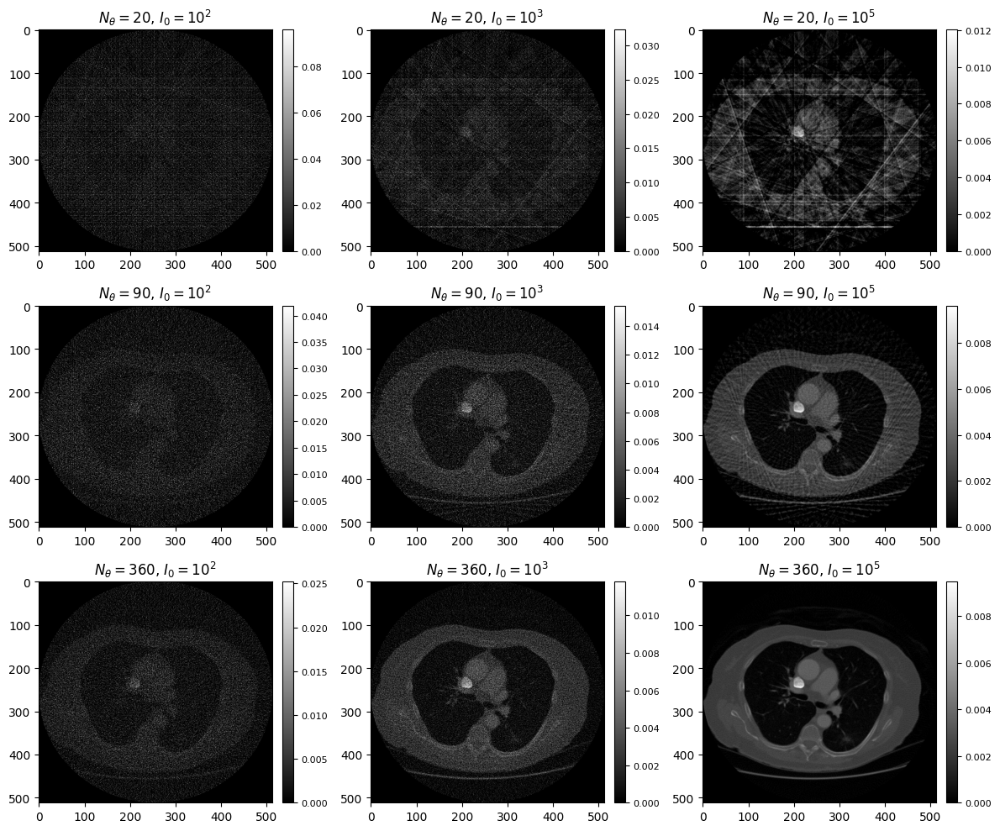

FBP total runtime: 2.15 s
FBP metrics
angles       I0       rmse     rel_l2       psnr       ssim
-----------------------------------------------------------
    20    1e+02     0.0125     8.5941      -1.97     0.1813
    20    1e+03     0.0042     2.8536       7.61     0.1876
    20    1e+05     0.0011     0.7346      19.40     0.3408
    90    1e+02     0.0055     3.7851       5.16     0.1841
    90    1e+03     0.0019     1.2788      14.58     0.2137
    90    1e+05     0.0004     0.2493      28.78     0.5741
   360    1e+02     0.0028     1.9328      10.99     0.1946
   360    1e+03     0.0010     0.6869      19.98     0.2779
   360    1e+05     0.0001     0.0870      37.93     0.8789



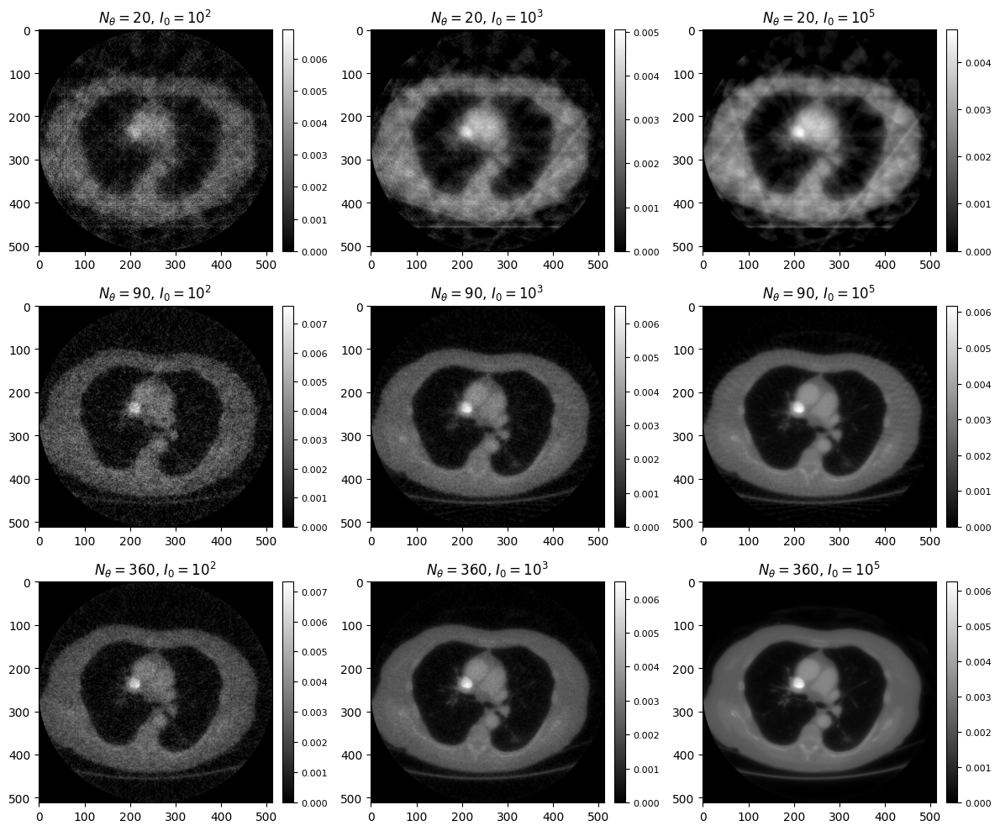

GD total runtime: 241.30 s
GD metrics
angles       I0       rmse     rel_l2       psnr       ssim
-----------------------------------------------------------
    20    1e+02     0.0007     0.5030      22.69     0.3316
    20    1e+03     0.0005     0.3417      26.04     0.5710
    20    1e+05     0.0005     0.3174      26.69     0.6834
    90    1e+02     0.0006     0.4276      24.10     0.3629
    90    1e+03     0.0003     0.2377      29.20     0.6605
    90    1e+05     0.0003     0.2043      30.51     0.8173
   360    1e+02     0.0004     0.3049      27.03     0.4895
   360    1e+03     0.0003     0.2083      30.35     0.7652
   360    1e+05     0.0003     0.1950      30.92     0.8552


In [10]:
comparison_1_1_c = module_1.compare_reconstruction_methods(image, noisy_sinogram_dict, save_prefix='exercise_1_1_c')

FBP_backprojection_dict = comparison_1_1_c['FBP']['reconstructions']
GD_backprojection_dict = comparison_1_1_c['GD']['reconstructions']

### Exercise 1.2 (a)

Sometimesduetomeasurementconstraints(e.g. arobotarminimageguidedsurgery)or
forscannerdesign(e.g. DigitalBreast Tomosynthesis).

Simulatenoisysinogramsat threedifferent angular ranges,180, 120, 40

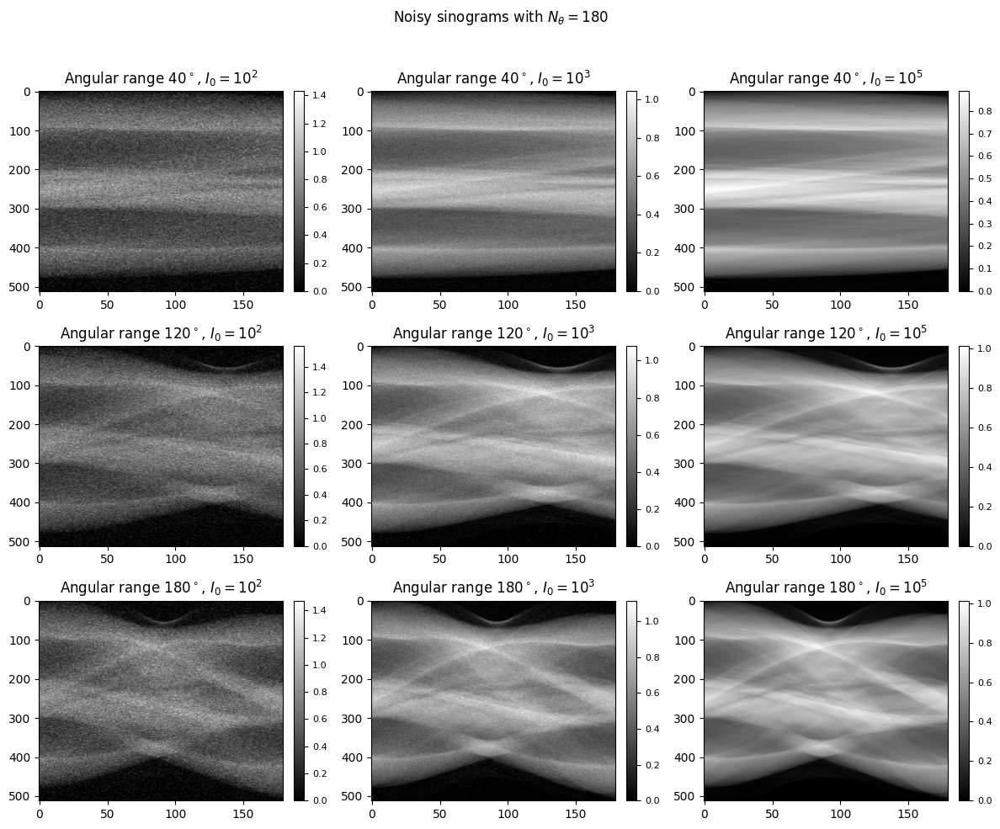

In [ ]:
# 1.2a: one 3x3 grid over angular range and dose with fixed N_theta
limited_angle_ranges = [180, 120, 40]
limited_angles_list = [180]
limited_i0_list = [1e2, 1e3, 1e5]

limited_angle_sinograms = module_1.plot_limited_angle_sinograms(
    image,
    angle_ranges=limited_angle_ranges,
    projection_count=limited_angles_list[0],
    I0_list=limited_i0_list,
    seed=CT_SEED,
    save_filename='exercise_1_2_a.png')

### Exercise 1.2 (b)

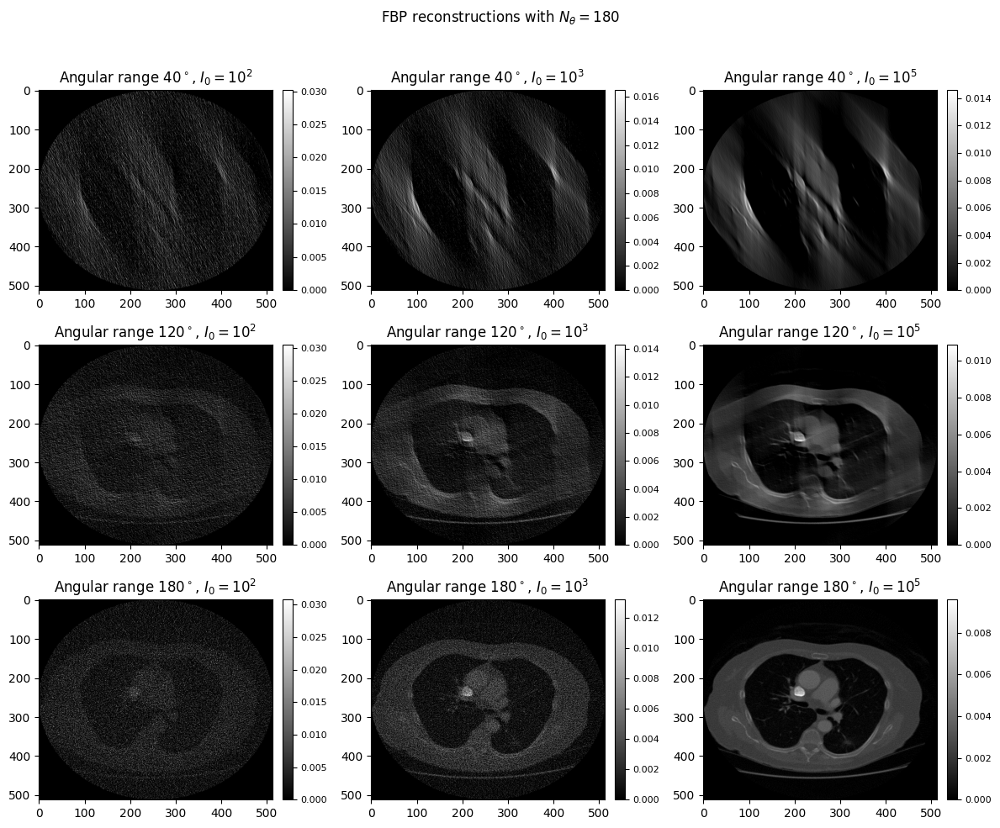

FBP total runtime: 3.27 s
FBP metrics
 range       I0       rmse       psnr       ssim
------------------------------------------------
    40    1e+02     0.0041       7.80     0.1891
    40    1e+03     0.0019      14.65     0.2461
    40    1e+05     0.0013      17.42     0.3979
   120    1e+02     0.0040       8.04     0.1884
   120    1e+03     0.0015      16.68     0.2444
   120    1e+05     0.0006      24.15     0.6826
   180    1e+02     0.0039       8.10     0.1877
   180    1e+03     0.0014      17.28     0.2383
   180    1e+05     0.0002      35.51     0.8084



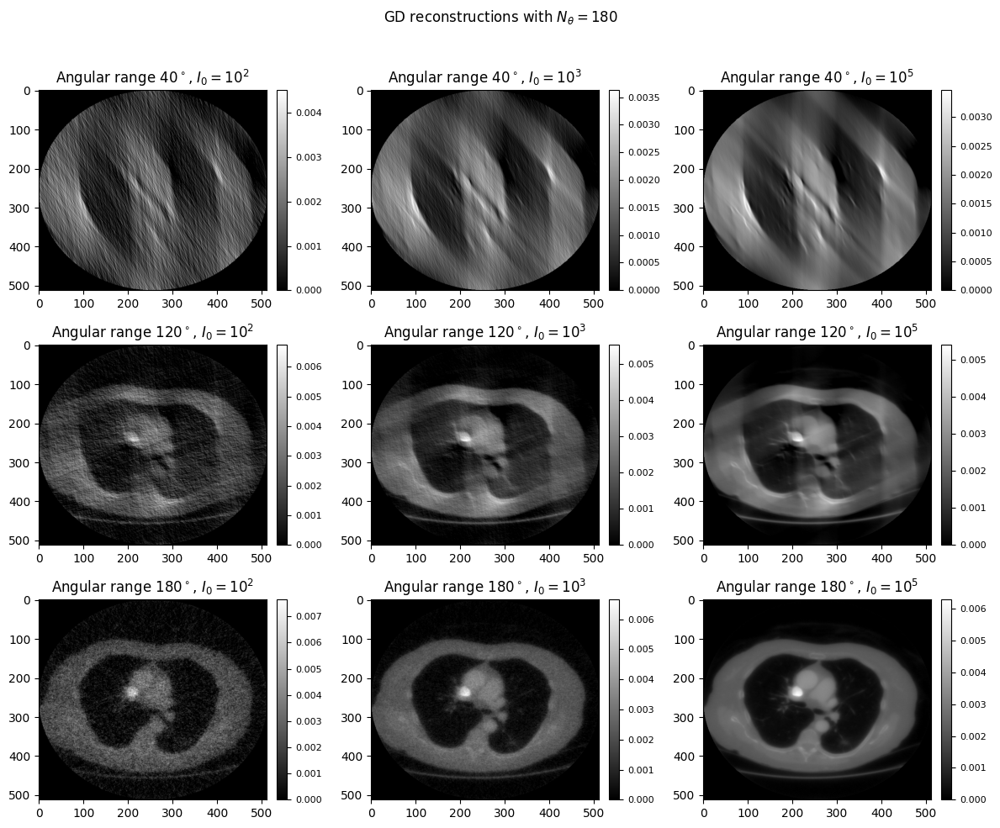

GD total runtime: 292.01 s
GD metrics
 range       I0       rmse       psnr       ssim
------------------------------------------------
    40    1e+02     0.0010      20.20     0.3445
    40    1e+03     0.0009      20.93     0.5083
    40    1e+05     0.0009      21.03     0.5622
   120    1e+02     0.0007      22.95     0.3865
   120    1e+03     0.0006      24.98     0.6433
   120    1e+05     0.0005      25.28     0.7355
   180    1e+02     0.0005      25.26     0.4053
   180    1e+03     0.0003      29.82     0.7109
   180    1e+05     0.0003      30.91     0.8543


In [17]:
# 1.2b: reconstruct the fixed-N_theta limited-angle sinograms with FBP and GD
comparison_1_2_b = module_1.compare_limited_angle_reconstruction_methods(
    image,
    angle_ranges=limited_angle_ranges,
    projection_count=limited_angles_list[0],
    I0_list=limited_i0_list,
    seed=CT_SEED,
    save_prefix='exercise_1_2_b')

### Exercise 1.3 (a)

Shepp–Logan: ramp multiplied by a sinc window. This slightly rolls off high frequencies, reducing noise compared to pure Ram–Lak while keeping reasonably sharp edges.
Cosine: ramp multiplied by a cosine window. This more strongly suppresses high frequencies, giving smoother (less noisy) but more blurred reconstructions.

### Exercise 1.3 (b)

Filter comparison metrics for N_theta=360, I0=1e+02
method               RMSE       SSIM
------------------------------------
Ram-Lak            0.0028     0.1946
Shepp-Logan        0.0023     0.2012
Cosine             0.0016     0.2251


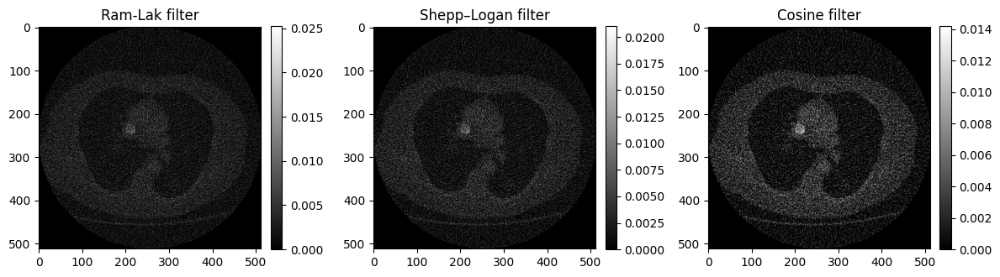

In [30]:
angles, I0 = 360, 1e2  # choose a low-dose example
reconstructions = module_1.FBP_compare_filters(noisy_sinogram_dict, angles=angles, I0=I0)
module_1.plot_filter_comparison(reconstructions, save_filename='exercise_1_3_b.png')

### Exercise 1.3 (c)

SIRT vs OS-SART metrics for N_theta=360, I0=1e+02, iterations=50, subsets=5
method               RMSE       SSIM  runtime_s
-----------------------------------------------
SIRT               0.0004     0.4895      68.19
OS-SART            0.0011     0.2615      71.00


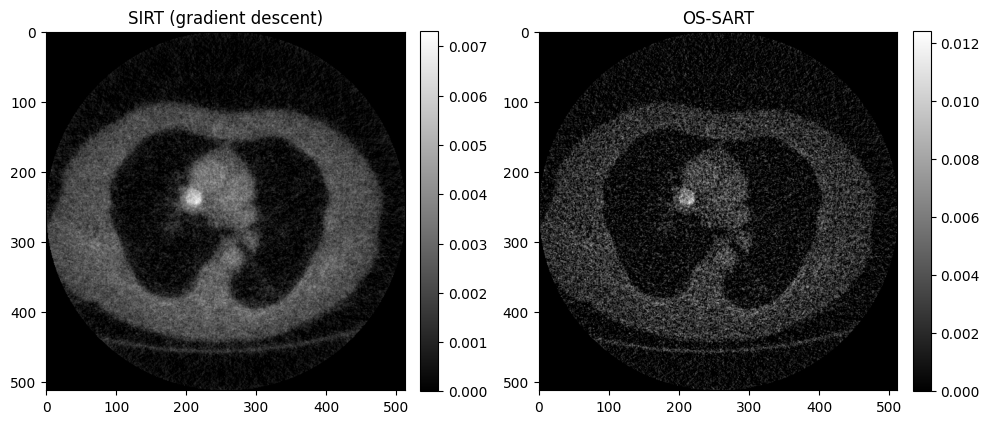

{'reconstructions': {'SIRT': array([[0., 0., 0., ..., 0., 0., 0.],
         [0., 0., 0., ..., 0., 0., 0.],
         [0., 0., 0., ..., 0., 0., 0.],
         ...,
         [0., 0., 0., ..., 0., 0., 0.],
         [0., 0., 0., ..., 0., 0., 0.],
         [0., 0., 0., ..., 0., 0., 0.]], shape=(512, 512)),
  'OS-SART': array([[0., 0., 0., ..., 0., 0., 0.],
         [0., 0., 0., ..., 0., 0., 0.],
         [0., 0., 0., ..., 0., 0., 0.],
         ...,
         [0., 0., 0., ..., 0., 0., 0.],
         [0., 0., 0., ..., 0., 0., 0.],
         [0., 0., 0., ..., 0., 0., 0.]], shape=(512, 512))},
 'metrics': {'SIRT': {'mse': 1.9795973424539687e-07,
   'rmse': 0.0004449266616481832,
   'mae': 0.0002932634294463928,
   'psnr': 27.034231378869226,
   'ssim': 0.48948913039130754},
  'OS-SART': {'mse': 1.1789736625832885e-06,
   'rmse': 0.0010858055362647993,
   'mae': 0.0006941751503927449,
   'psnr': 19.28495896620352,
   'ssim': 0.26147708221177507}},
 'runtimes': {'SIRT': 68.1869731250008, 'OS-SART': 71

In [48]:
module_1.plot_compare_SIRT_OS_SART(noisy_sinogram_dict, angles=360, I0=1e2, angle_range=360, max_iter=50, gamma=0.001, n_subsets=5, save_filename='exercise_1_3_c.png')

## Module 2

### Exercise 2.1 (a)

Coil dimension: 0 (axis 0)


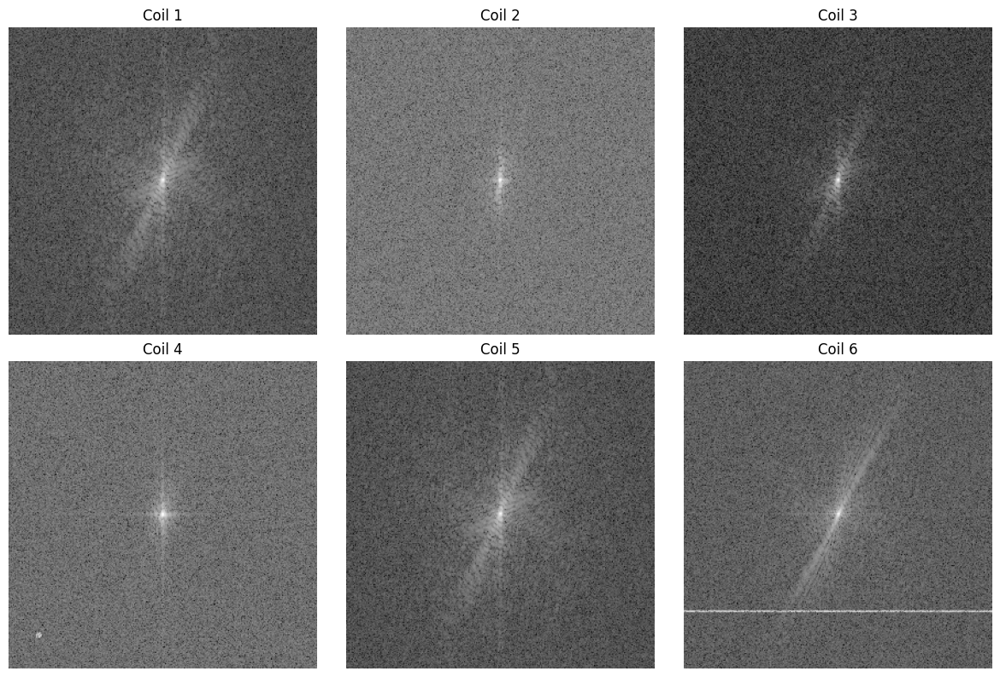

In [32]:
knee_data = module_2.load_kspace_data()
print("Coil dimension:", module_2.coil_dimension(knee_data), "(axis 0)")
kspace_mags = module_2.get_kspace_coil_mags(knee_data)
module_2.plot_kspace_coil_mags(kspace_mags, save_filename='exercise_2_1_a.png')


### Exercise 2.1 (b)

### Exercise 2.1 (c)

Transform to image space; magnitude and phase from one coil.

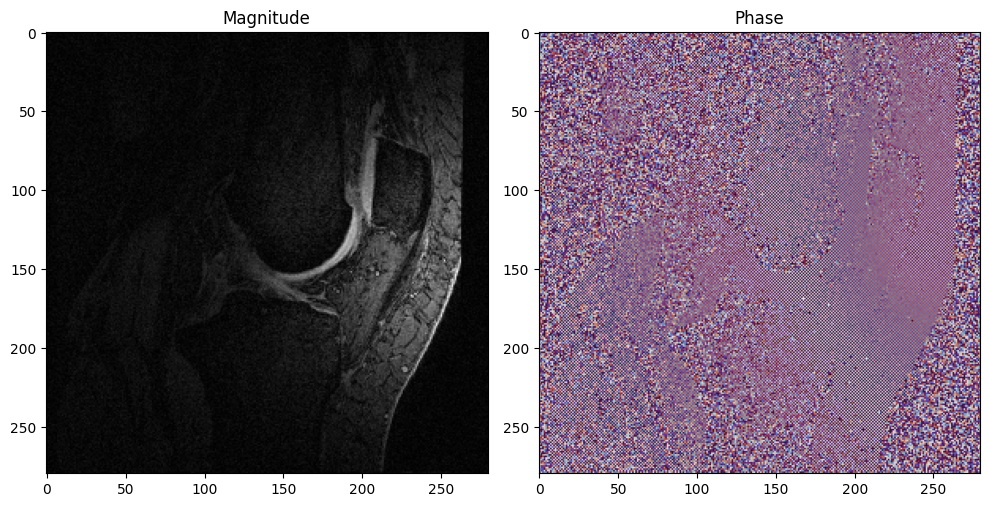

In [33]:
image_space = module_2.kspace_to_image_space(knee_data)
module_2.plot_one_coil_mag_phase(image_space[0], save_filename='exercise_2_1_c.png')


### Exercise 2.1 (d)

Magnitude images from all coils (image space).

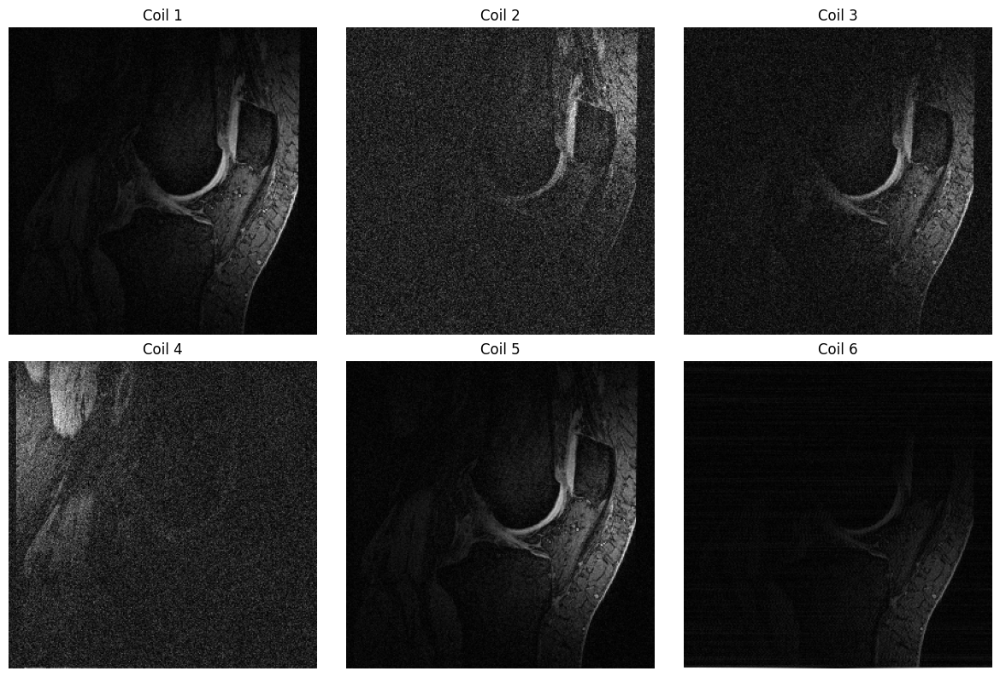

In [34]:
module_2.plot_all_coil_magnitudes(image_space, save_filename='exercise_2_1_d.png')


### Exercise 2.1 (e)

Combine coils (root-sum-of-squares).

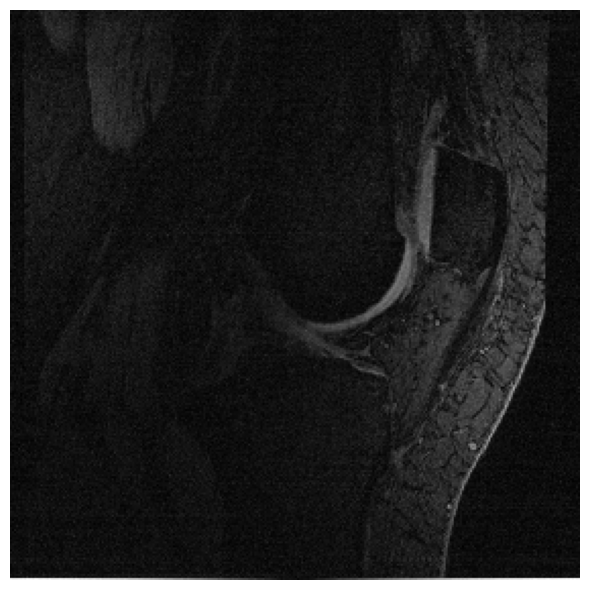

In [35]:
combined = module_2.combine_coils(image_space)
module_2.plot_combined(combined, save_filename='exercise_2_1_e.png')


## Exercise 2.2 (a) Removing noise

Choose three denoising methods using the image-space data and show the effects for all coils.


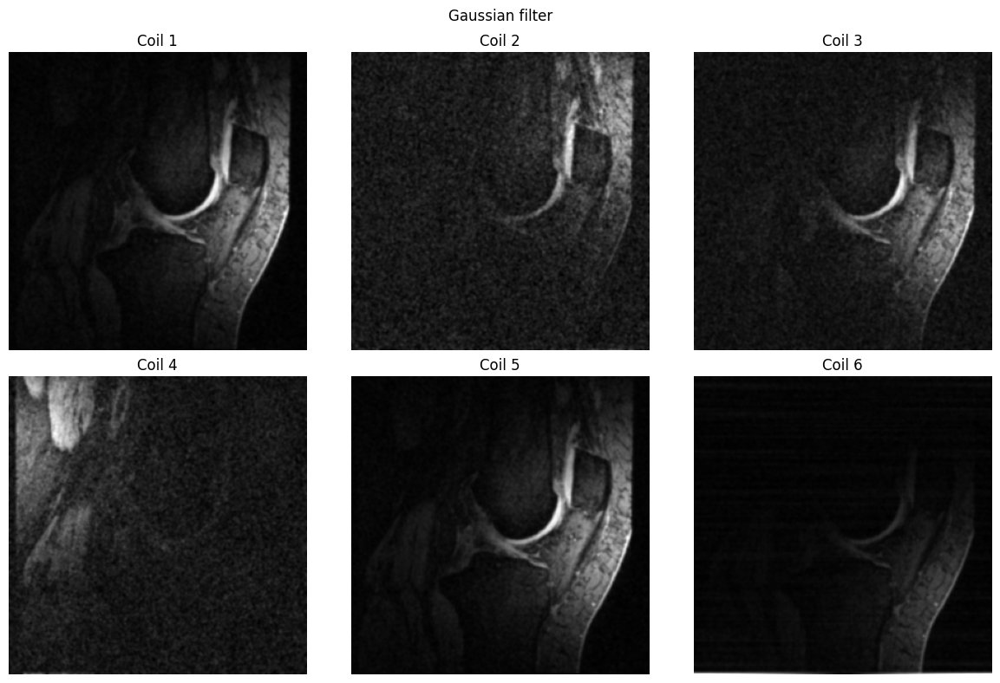

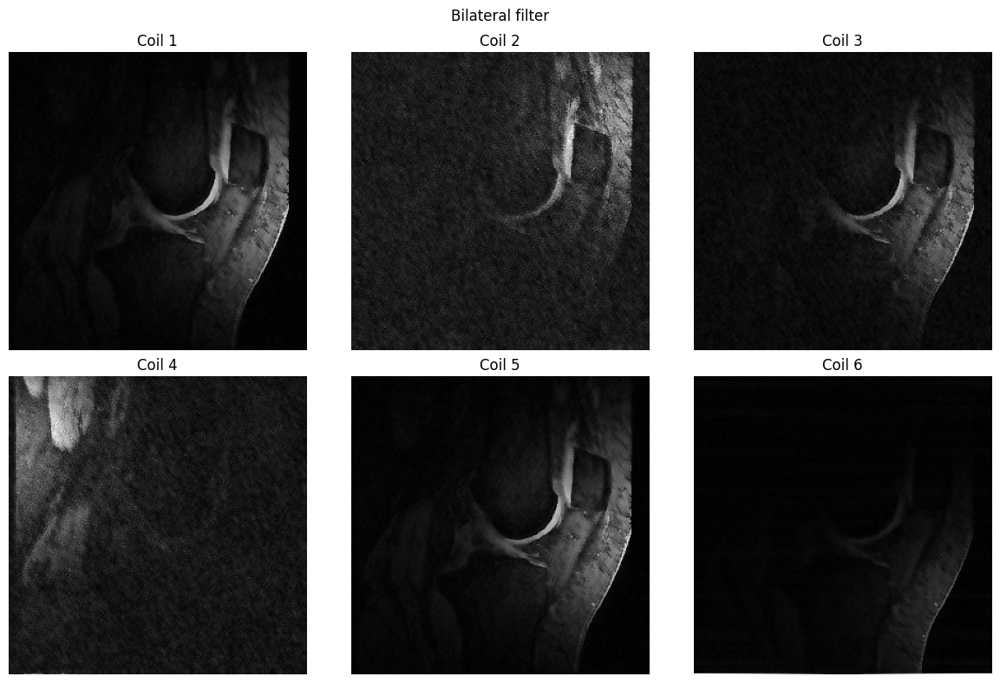

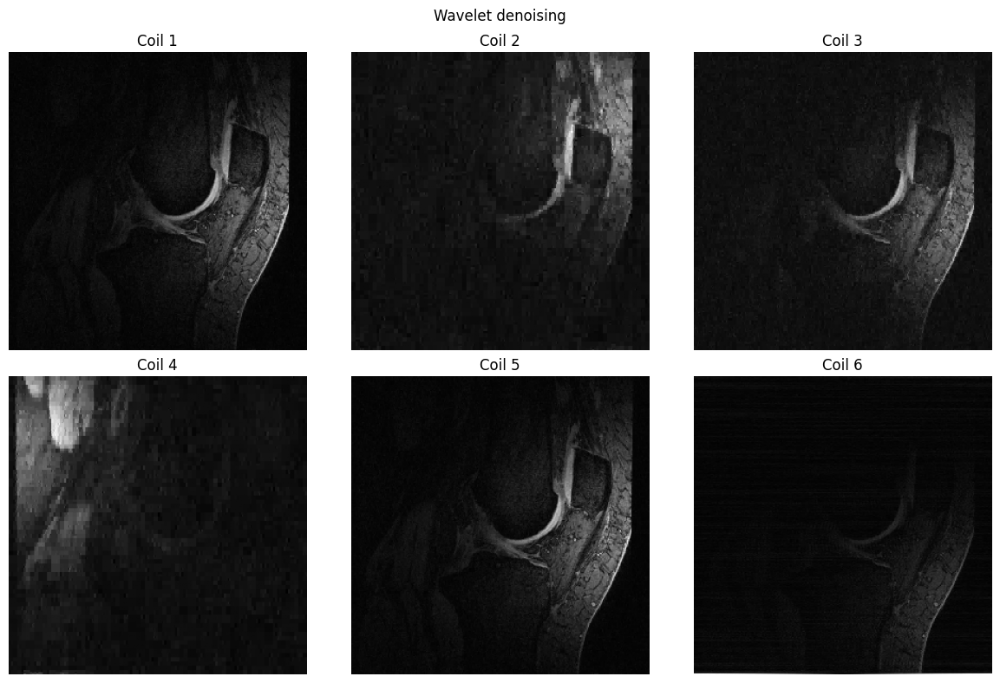

In [45]:
denoised_gaussian = module_2.denoise_coils_gaussian(image_space, sigma=1.0)
module_2.plot_denoised_coils(denoised_gaussian, title='Gaussian filter', save_filename='exercise_2_2_a_gaussian.png')

denoised_bilateral = module_2.denoise_coils_bilateral(image_space, sigma_spatial=1)
module_2.plot_denoised_coils(denoised_bilateral, title='Bilateral filter', save_filename='exercise_2_2_a_bilateral.png')

denoised_wavelet = module_2.denoise_coils_wavelet(image_space, method='BayesShrink')
module_2.plot_denoised_coils(denoised_wavelet, title='Wavelet denoising', save_filename='exercise_2_2_a_wavelet.png')


### Comments on denoising methods

- **Gaussian**: Smooths uniformly; reduces noise but blurs edges. Simple and fast.

- **Bilateral**: Edge-preserving; smooths flat regions but keeps edges sharper. Better for preserving anatomy at the cost of more computation.

- **Wavelet**: Separates signal into scales; removes small (noise-like) coefficients. Can preserve edges while reducing noise; choice of threshold (e.g. BayesShrink) affects result.

### Exercise 2.2 (b) Butterworth and combined denoising\n
\n
Start from the original noisy k-space, apply a low-pass Butterworth filter to the first coil,\n
and compare to image-based denoising and combined-coil denoising.\n


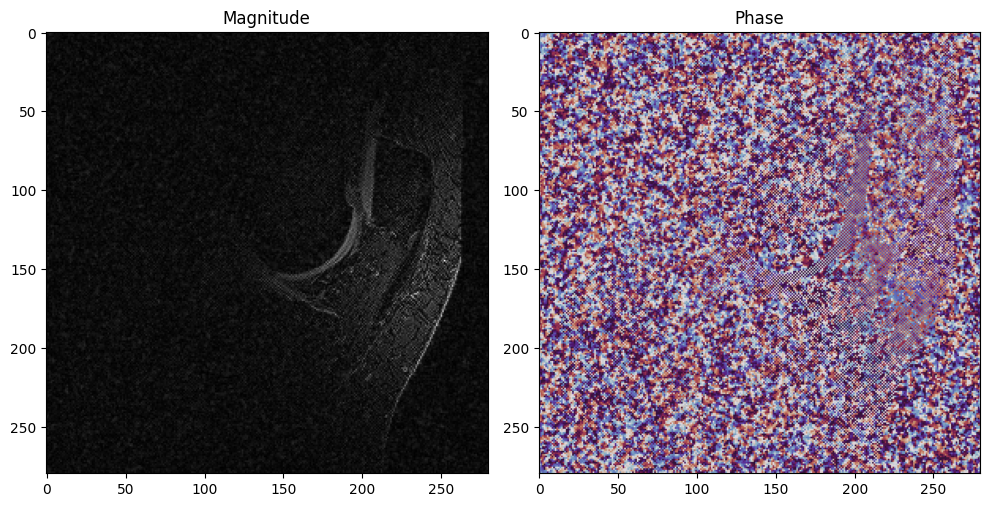

In [43]:
# Butterworth low-pass filter in k-space for first coil
butter_image = module_2.butterworth_first_coil_image(knee_data, D0=60, n=1)
module_2.plot_one_coil_mag_phase(butter_image, save_filename='exercise_2_2_b.png')

### Excercise 2.2 (c)

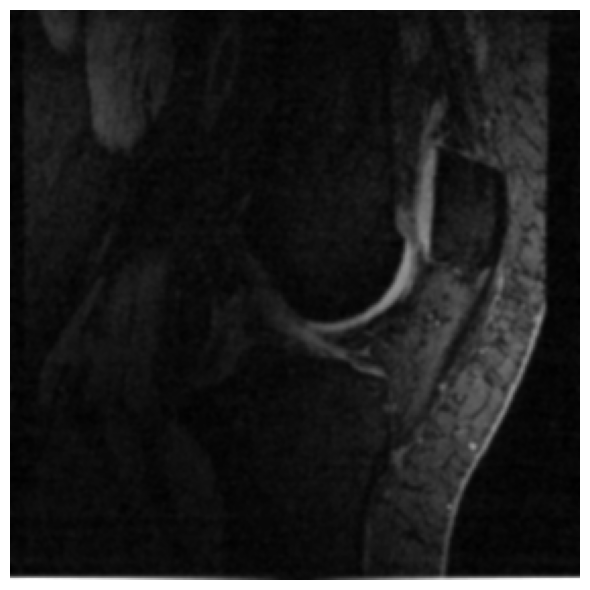

In [44]:
# Denoise the combined (root-sum-of-squares) image using Gaussian filter
denoised_combined = module_2.denoise_combined_gaussian(combined, sigma=1.0)
module_2.plot_combined(denoised_combined, save_filename='exercise_2_2_c.png')

### Comparison of denoising methods\n
\n
- **Butterworth in k-space (first coil)**: Smooths high-frequency components directly in k-space.\n
  This reduces noise but can also blur fine detail and introduce ringing if the cutoff is too sharp.\n
\n
- **Image-based Gaussian / bilateral / wavelet (per-coil)**: Operate in image space, often giving\n
  more intuitive control. Gaussian blurs uniformly; bilateral and wavelet preserve edges better\n
  while still reducing background noise.\n
\n
- **Denoised combined image**: Applying a mild Gaussian filter to the combined (rSOS) image\n
  smooths residual noise while largely preserving structure. Stronger filtering (larger sigma)\n
  would reduce noise further but blur edges.\n
\n
Further improvements could use more advanced methods such as non-local means or total-variation\n
denoising on the combined image, or regularised reconstruction methods that incorporate noise\n
statistics during image formation.\n